##### Colab-specific section (convert to code if needed)
import os
from google.colab import drive
drive.mount('/gdrive', force_remount=True)
!unlink "/content/coopmotion"
!ln -s "/gdrive/My Drive/coopmotion/" "/content/coopmotion"
!rm -r "/content/coopmotion/dataset (1)" "/content/coopmotion/dataset" "/content/coopmotion/models"

In [ ]:
!rm -r "/content/coopmotion/notebook/videos"

In [ ]:
#!mv -r "/content/videos" "/content/coopmotion/notebook/videos"
!mv "/content/videos" "/content/coopmotion/notebook/videos"

In [3]:
%load_ext autoreload
%autoreload 2

import sys
sys.path.append('../src')
sys.path.append('coopmotion/src') # COLAB
from matplotlib import pyplot as plt
import numpy as np
import torch
import time

from IPython.display import Audio
sound_file = './sound.wav'

# Learning

In [4]:
from task.square import SquareRun, proportional, sense, static_evenly_spread_task, static_zipf_task
controller = proportional
N = 21
sas, tas = 1, 1

In [5]:
#from task.fancy import animate_trace
#trace = run()
#animate_trace(trace, dt=0.05)

In [6]:
number_of_samples = 1000
valid_part = 0.1
keep = 0.1

# Centralized Network

In [7]:
task = static_evenly_spread_task(N, holonomic=True, spawn_area_size=sas, target_area_size=tas)
run = SquareRun(task, controller=controller, sensor=sense(), dt=0.1)

In [8]:
from task.dataset import generate_non_sequential_dataset, central_dataset
train_nseq = generate_non_sequential_dataset(run=run, number=number_of_samples, keep=keep, seed=0xDEADBEEF)
train_dataset, valid_dataset = central_dataset(train_nseq, valid_part)


train: x (902, 42)	y (902, 42)
valid: x (101, 42)	y (101, 42)


In [9]:
from keras_network import CentralizedNet
net = CentralizedNet(N, run.task.holonomic, patience=40)
history = net.train(epochs=200, train_dataset=train_dataset, valid_dataset=valid_dataset)

Train on 902 samples, validate on 101 samples
Epoch 1/200
902/902 [==============================] - 0s 150us/sample - loss: 0.0218 - mean_absolute_error: 0.1038 - val_loss: 0.0127 - val_mean_absolute_error: 0.0840
Epoch 2/200
902/902 [==============================] - 0s 33us/sample - loss: 0.0123 - mean_absolute_error: 0.0825 - val_loss: 0.0122 - val_mean_absolute_error: 0.0870
Epoch 3/200
902/902 [==============================] - 0s 32us/sample - loss: 0.0100 - mean_absolute_error: 0.0758 - val_loss: 0.0077 - val_mean_absolute_error: 0.0647
Epoch 4/200
902/902 [==============================] - 0s 31us/sample - loss: 0.0081 - mean_absolute_error: 0.0676 - val_loss: 0.0084 - val_mean_absolute_error: 0.0711
Epoch 5/200
902/902 [==============================] - 0s 30us/sample - loss: 0.0066 - mean_absolute_error: 0.0608 - val_loss: 0.0066 - val_mean_absolute_error: 0.0599
Epoch 6/200
902/902 [==============================] - 0s 31us/sample - loss: 0.0056 - mean_absolute_error: 0.056

Epoch 95/200
902/902 [==============================] - 0s 32us/sample - loss: 6.2028e-04 - mean_absolute_error: 0.0181 - val_loss: 6.6120e-04 - val_mean_absolute_error: 0.0187
Epoch 96/200
902/902 [==============================] - 0s 33us/sample - loss: 5.6286e-04 - mean_absolute_error: 0.0171 - val_loss: 7.7879e-04 - val_mean_absolute_error: 0.0198
Epoch 97/200
902/902 [==============================] - 0s 33us/sample - loss: 5.5989e-04 - mean_absolute_error: 0.0172 - val_loss: 6.1275e-04 - val_mean_absolute_error: 0.0179
Epoch 98/200
902/902 [==============================] - 0s 29us/sample - loss: 6.1857e-04 - mean_absolute_error: 0.0180 - val_loss: 6.3259e-04 - val_mean_absolute_error: 0.0179
Epoch 99/200
902/902 [==============================] - 0s 33us/sample - loss: 5.5052e-04 - mean_absolute_error: 0.0168 - val_loss: 9.5224e-04 - val_mean_absolute_error: 0.0228
Epoch 100/200
902/902 [==============================] - 0s 32us/sample - loss: 6.0782e-04 - mean_absolute_error: 0

902/902 [==============================] - 0s 29us/sample - loss: 4.0974e-04 - mean_absolute_error: 0.0150 - val_loss: 3.9960e-04 - val_mean_absolute_error: 0.0132
Epoch 188/200
902/902 [==============================] - 0s 33us/sample - loss: 3.8874e-04 - mean_absolute_error: 0.0146 - val_loss: 5.3625e-04 - val_mean_absolute_error: 0.0185
Epoch 189/200
902/902 [==============================] - 0s 33us/sample - loss: 4.4736e-04 - mean_absolute_error: 0.0156 - val_loss: 6.8539e-04 - val_mean_absolute_error: 0.0180
Epoch 190/200
902/902 [==============================] - 0s 34us/sample - loss: 3.8548e-04 - mean_absolute_error: 0.0146 - val_loss: 6.3666e-04 - val_mean_absolute_error: 0.0192
Epoch 191/200
902/902 [==============================] - 0s 34us/sample - loss: 3.9640e-04 - mean_absolute_error: 0.0149 - val_loss: 4.1237e-04 - val_mean_absolute_error: 0.0145
Epoch 192/200
902/902 [==============================] - 0s 31us/sample - loss: 4.3407e-04 - mean_absolute_error: 0.0156 - v

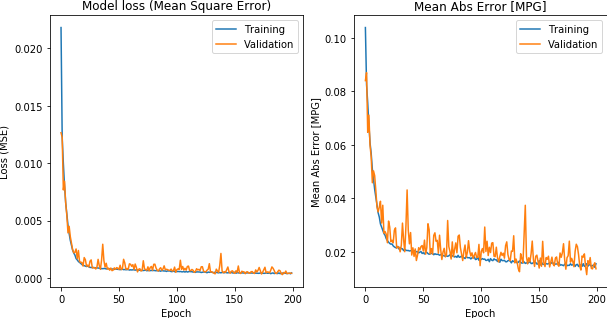

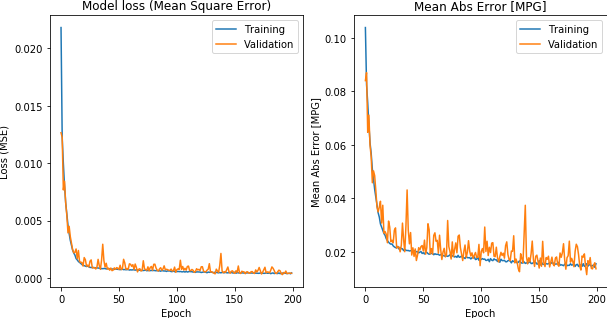

In [10]:
from task.fancy import training_plot
training_plot(history)

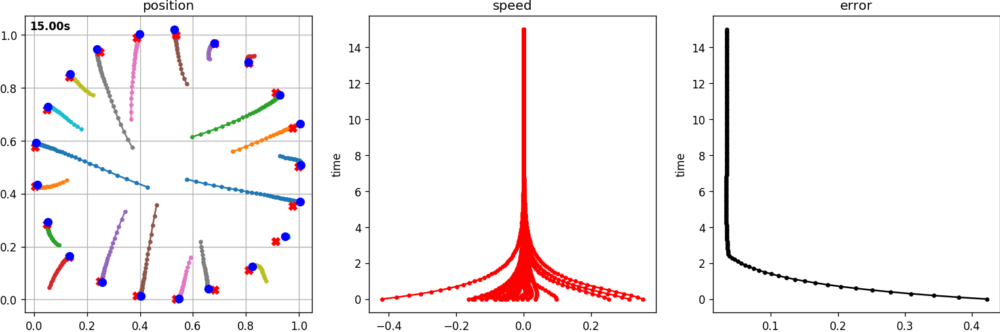

In [11]:
from task import Run
from task.fancy import plot_trace
net_controller = net.controller()
net_run = Run(task, sensor=run.sensor, dt=0.1, controller=net_controller)
c_trace = net_run(T=15, epsilon=0.01, seed=0xDEADBEEF)
plot_trace(c_trace, task)

In [12]:
from task.fancy import TracesAnimator
expert_trace = run(T=10, epsilon=0.01, seed=0xDEADBEEF)
TracesAnimator({'expert':expert_trace,'centralized': c_trace}, dt=0.05)

### How well are we controlling the agents?

In [13]:
from task.dataset import generate_sequential_dataset
comp_run, comp_duration, comp_steps = 100, 10, 50
exact_traces = generate_sequential_dataset(run, number=comp_run, duration=comp_duration, epsilon=0.01)
net_traces = generate_sequential_dataset(net_run, number=comp_run, duration=comp_duration, epsilon=0.01)
from task import prepare
exact_traces = [prepare(t, padding=True, steps=comp_steps) for t in exact_traces]
net_traces = [prepare(t, padding=True, steps=comp_steps) for t in net_traces]
time = exact_traces[0].time
exact_error = np.array([t.error for t in exact_traces])
net_error = np.array([t.error for t in net_traces])

Undefined 'steps': assuming 'number' specifies the number of runs (instead of desired samples)



Undefined 'steps': assuming 'number' specifies the number of runs (instead of desired samples)



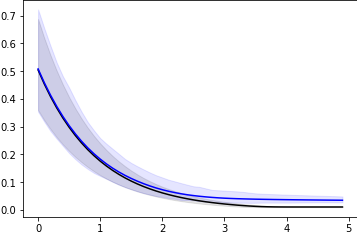

In [14]:
from task.fancy import plot_error
plot_error(time, exact_error, color='black', label='exact')
plot_error(time, net_error, color='blue', label='net')

## Distributed Network

In [53]:
from task.square import adaptive_evenly_spread_task, adaptive_zipf_task
task = adaptive_evenly_spread_task(N, holonomic=True, spawn_area_size=sas, target_area_size=tas)
run = SquareRun(task, controller=controller, sensor=sense(), dt=0.1)

In [54]:
number_of_samples = 10000
from task.dataset import distributed_dataset
train_nseq = generate_non_sequential_dataset(run=run, number=number_of_samples, keep=keep)
d_train_dataset, d_valid_dataset = distributed_dataset(train_nseq, valid_part)


x (189056, 40)	y (189056, 2)


40
Train on 189056 samples, validate on 21007 samples
Epoch 1/500
189056/189056 [==============================] - 5s 28us/sample - loss: 0.0050 - mean_absolute_error: 0.0420 - val_loss: 0.0028 - val_mean_absolute_error: 0.0297e_error:
Epoch 2/500
189056/189056 [==============================] - 5s 27us/sample - loss: 0.0028 - mean_absolute_error: 0.0288 - val_loss: 0.0029 - val_mean_absolute_error: 0.0331ss: 0.0028 - mean_absolute_er
Epoch 3/500
189056/189056 [==============================] - 5s 27us/sample - loss: 0.0026 - mean_absolute_error: 0.0273 - val_loss: 0.0025 - val_mean_absolute_error: 0.0259
Epoch 4/500
189056/189056 [==============================] - 5s 27us/sample - loss: 0.0025 - mean_absolute_error: 0.0262 - val_loss: 0.0024 - val_mean_absolute_error: 0.0249
Epoch 5/500
189056/189056 [==============================] - 5s 28us/sample - loss: 0.0025 - mean_absolute_error: 0.0256 - val_loss: 0.0024 - val_mean_absolute_error: 0.0244
Epoch 6/500
189056/189056 [============

Epoch 47/500
189056/189056 [==============================] - 5s 26us/sample - loss: 0.0022 - mean_absolute_error: 0.0226 - val_loss: 0.0022 - val_mean_absolute_error: 0.0232
Epoch 48/500
189056/189056 [==============================] - 5s 26us/sample - loss: 0.0022 - mean_absolute_error: 0.0226 - val_loss: 0.0023 - val_mean_absolute_error: 0.0238
Epoch 49/500
189056/189056 [==============================] - 5s 26us/sample - loss: 0.0022 - mean_absolute_error: 0.0226 - val_loss: 0.0023 - val_mean_absolute_error: 0.0257
Epoch 50/500
189056/189056 [==============================] - 5s 26us/sample - loss: 0.0022 - mean_absolute_error: 0.0226 - val_loss: 0.0022 - val_mean_absolute_error: 0.0201
Epoch 51/500
189056/189056 [==============================] - 5s 28us/sample - loss: 0.0022 - mean_absolute_error: 0.0226 - val_loss: 0.0021 - val_mean_absolute_error: 0.0203
Epoch 52/500
189056/189056 [==============================] - 5s 28us/sample - loss: 0.0022 - mean_absolute_error: 0.0226 - v

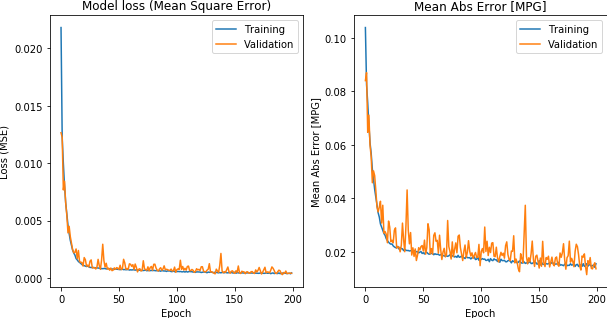

In [55]:
from keras_network import DistributedNet
d_net = DistributedNet(run=run, patience=40)
istory = d_net.train(epochs=500, train_dataset=d_train_dataset, valid_dataset=d_valid_dataset, verbose=1)
training_plot(history)
Audio(sound_file, autoplay=True)

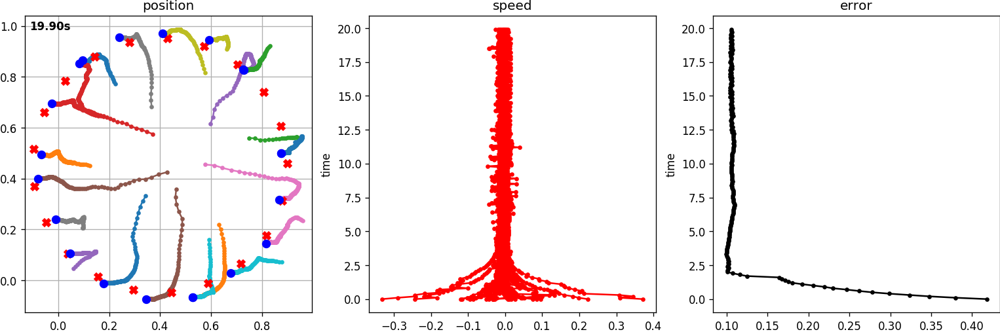

In [56]:
d_net_controller = d_net.controller()
d_net_run = Run(task, sensor=run.sensor, dt=0.1, controller=d_net_controller)
d_trace = d_net_run(T=20, epsilon=0.01, seed=0xDEADBEEF)
plot_trace(d_trace, task)

In [57]:
expert_trace = run(T=10, epsilon=0.01, seed=0xDEADBEEF)
TracesAnimator({'expert':expert_trace,'centralized': c_trace, 'distributed': d_trace}, dt=0.05)

In [58]:
d_net_traces = generate_sequential_dataset(d_net_run, number=comp_run, duration=comp_duration, epsilon=0.01)
d_net_traces = [prepare(t, padding=True, steps=comp_steps) for t in d_net_traces]
d_net_error = np.array([t.error for t in d_net_traces])
Audio(sound_file, autoplay=True)

Undefined 'steps': assuming 'number' specifies the number of runs (instead of desired samples)



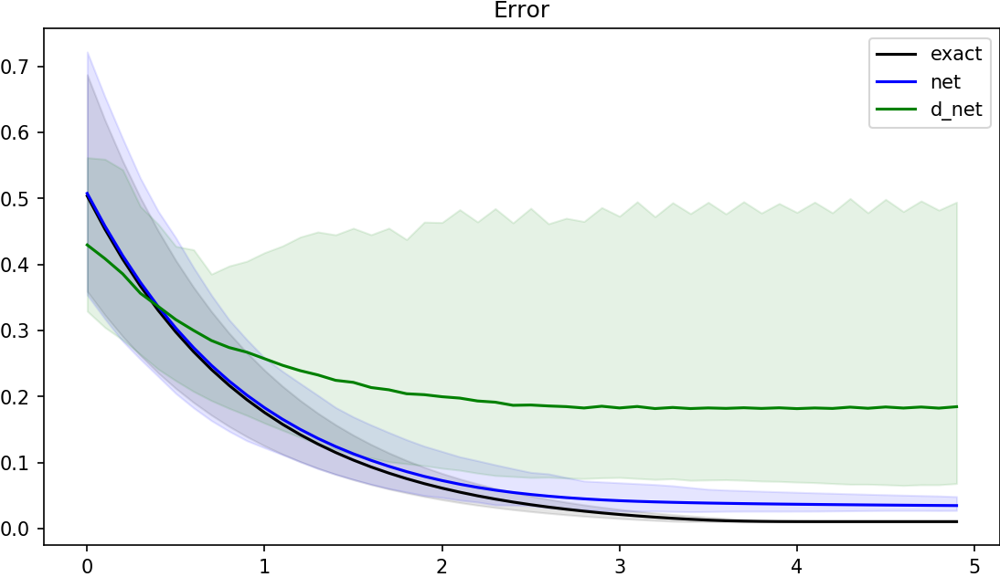

In [59]:
fig = plt.figure(figsize=(9, 5), dpi=150)
plot_error(time, exact_error, color='black', label='exact')
plot_error(time, net_error, color='blue', label='net')
plot_error(time, d_net_error, color='green', label='d_net')
plt.legend()
plt.title('Error');

## Distributed Communicating Network

In [78]:
from task.square import SquareRun
task = adaptive_evenly_spread_task(N, spawn_area_size=sas, target_area_size=tas, holonomic=True)
run = SquareRun(task, controller=controller, sensor=sense(robot_range=10), dt=0.1)

### Standard training

In [79]:
steps = 5
number_of_samples = 1000
from task.dataset import sequence_dataset

In [80]:
from com_network import ComNet
from pytorch_network import train_net
cd_net = ComNet(N=N, broadcast=5)
cd_training_loss, cd_testing_loss = [], []

In [81]:
train_traces = generate_sequential_dataset(run=run, number=number_of_samples, steps=steps, keep=keep)
test_traces = generate_sequential_dataset(run=run, number=number_of_samples, steps=steps, keep=keep)
cd_train_dataset = sequence_dataset(train_traces)
cd_test_dataset  = sequence_dataset(test_traces)

train_net(epochs=10, net=cd_net, train_dataset=cd_train_dataset, test_dataset=cd_test_dataset, batch_size=1, training_loss=cd_training_loss, testing_loss=cd_testing_loss, disable_tqdm=False)
Audio(sound_file, autoplay=True)

  0%|          | 0/10 [00:00<?, ?it/s]

100%|██████████| 10/10 [09:40<00:00, 58.88s/it]


#### Testing

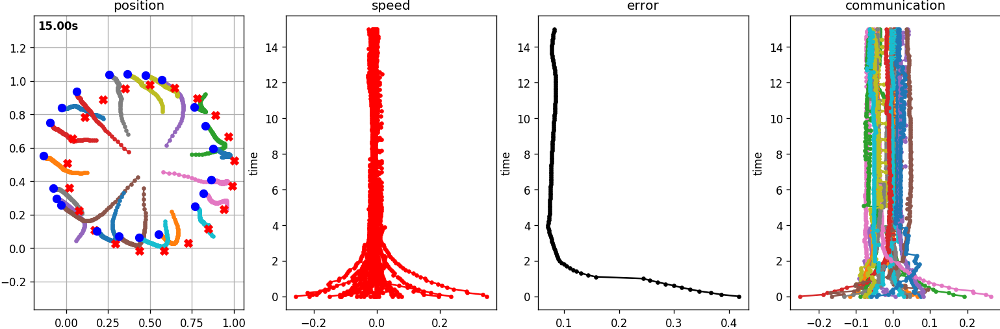

In [82]:
cd_net_controller = cd_net.controller()
cd_net_run = Run(task, sensor=run.sensor, dt=0.1, controller=cd_net_controller)
cd_trace = cd_net_run(T=15, seed=0xDEADBEEF)
expert_trace = run(T=15, seed=0xDEADBEEF)
plot_trace(cd_trace,task)

In [83]:
# animate_trace(trace, robot_range=20, dt= 0.05)
traces_dict = {'expert':expert_trace,'centralized (static)': c_trace, 
               'distributed': d_trace, 'distributed (comm)': cd_trace}
TracesAnimator(traces_dict, robot_range=10, dt=0.05)

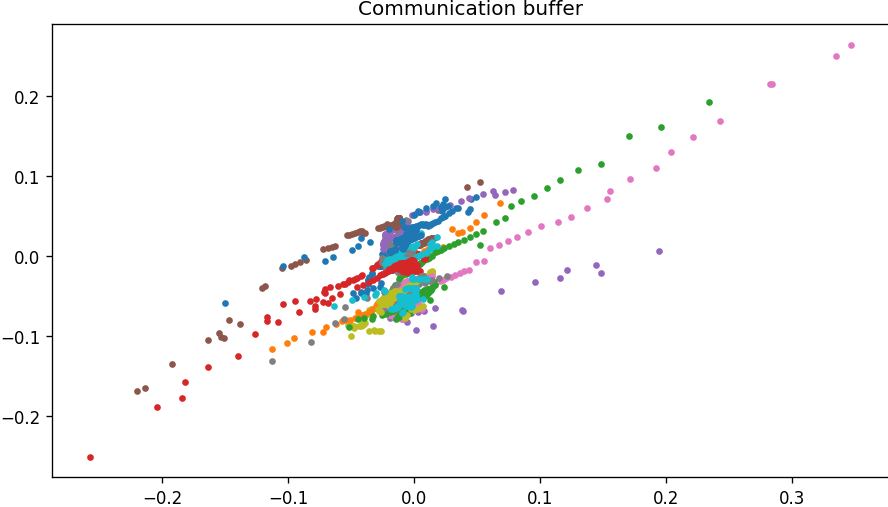

In [84]:
fig = plt.figure(figsize=(9, 5), dpi=120)
plt.plot(cd_trace.control[:,:,0], cd_trace.communication[:,0,:], '.');
plt.title('Communication buffer');

In [85]:
cd_net_traces = generate_sequential_dataset(cd_net_run, number=100, duration=5, epsilon=0.01)
cd_net_traces = [prepare(t, padding=True, steps=50) for t in cd_net_traces]
cd_net_error = np.array([t.error for t in cd_net_traces])
Audio(sound_file, autoplay=True)

Undefined 'steps': assuming 'number' specifies the number of runs (instead of desired samples)



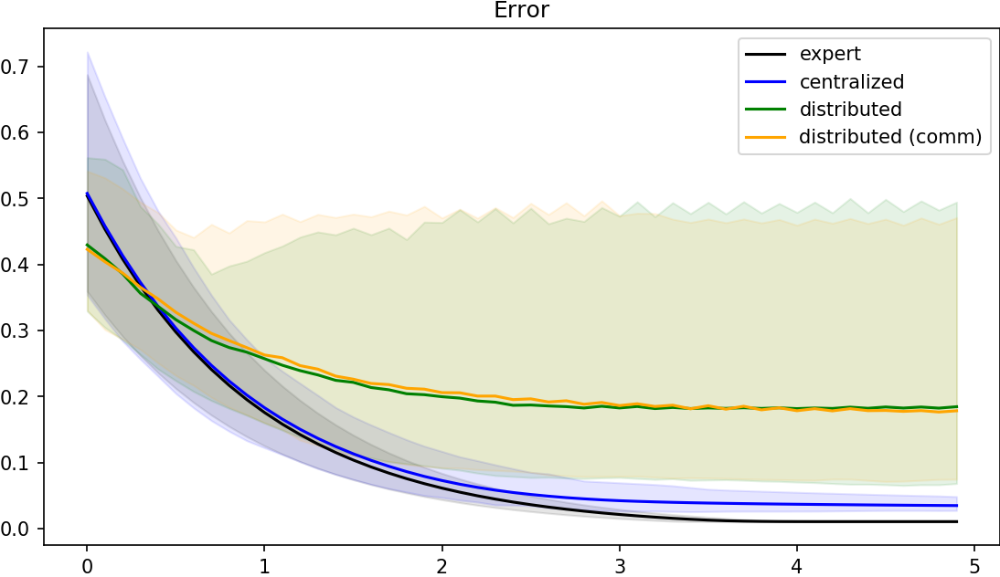

In [86]:
fig = plt.figure(figsize=(9, 5), dpi=150)
plot_error(time, exact_error, color='black', label='expert')
plot_error(time, net_error, color='blue', label='centralized')
plot_error(time, d_net_error, color='green', label='distributed')
plot_error(time, cd_net_error, color='orange', label='distributed (comm)')
plt.legend()
plt.title('Error');

### DAgger Training

In [69]:
# you probably want to reset first
cd_net = ComNet(N=N, broadcast=5)
cd_training_loss, cd_testing_loss = [], []

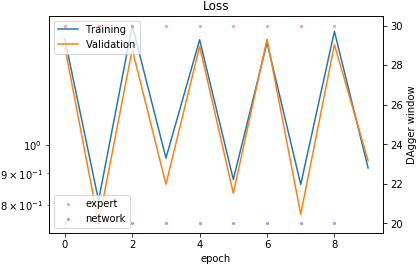

In [70]:
from IPython.display import display, clear_output
from task.square import DaggerSquareRun
from task.fancy import pytorch_dagger_plot
from task.math import dagger_remappers

#import matplotlib.pyplot as plt
steps = 5
keep = 0.1
epochs = 10
safe_limsup = 60
samples_per_epoch = 100
#_, net_ws = dagger_remappers(epochs,safe_limsup, 0)
#exp_ws = safe_limsup - net_ws
exp_ws = [30]*epochs
net_ws = [20]*epochs
for e in range(epochs):
    print(f"Epoch {e+1}")
    dagger_run = DaggerSquareRun(cd_net, task, controller, run.sensor, 
                                 expert_window=exp_ws[e], net_window=net_ws[e])
    
    train_test = [generate_sequential_dataset(run=dagger_run, 
                                              number=samples_per_epoch, disable_tqdm=False,
                                               steps=steps, keep=keep, duration=10) for _ in range(2)]
    cd_train_dataset, cd_test_dataset = [sequence_dataset(raw_data) for raw_data in train_test]
    
    train_net(epochs=1, net=cd_net, train_dataset=cd_train_dataset, test_dataset=cd_test_dataset, batch_size=1, 
          training_loss=cd_training_loss, testing_loss=cd_testing_loss, disable_tqdm=False)
    
    fig = pytorch_dagger_plot(cd_training_loss, cd_testing_loss, net_ws[:e], exp_ws[:e])
    
    display(fig)
    clear_output(wait = True)
    plt.pause(0.5)

### Testing

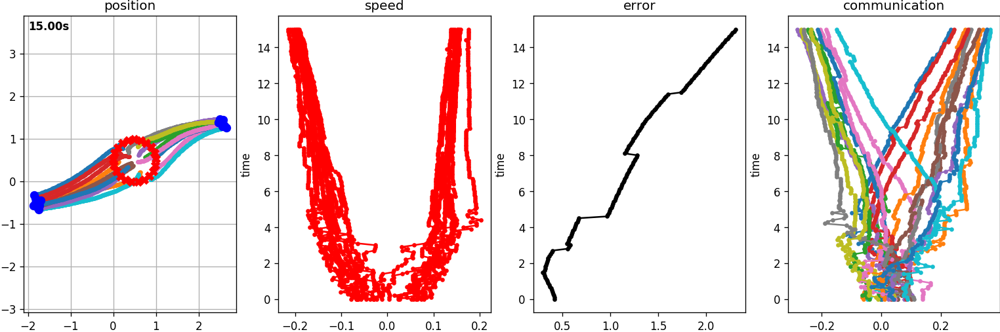

In [71]:
cd_net_controller = cd_net.controller()
cd_net_run = Run(task, sensor=run.sensor, dt=0.1, controller=cd_net_controller)
cd_trace = cd_net_run(T=15, seed=0xDEADBEEF)
expert_trace = run(T=15, seed=0xDEADBEEF)
plot_trace(cd_trace,task)

In [72]:
# animate_trace(trace, robot_range=20, dt= 0.05)
traces_dict = {'expert':expert_trace,'centralized (static)': c_trace, 
               'distributed': d_trace, 'distributed (comm)': cd_trace}
TracesAnimator(traces_dict, robot_range=10, dt=0.05)

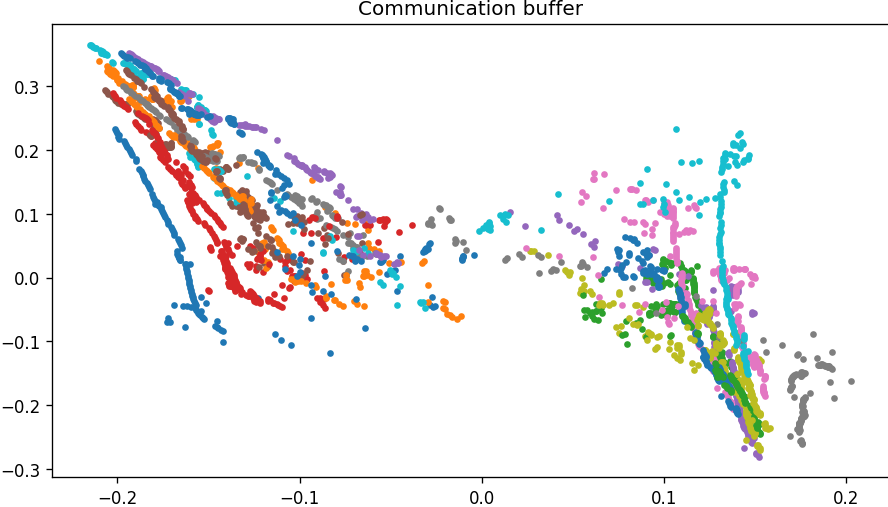

In [73]:
fig = plt.figure(figsize=(9, 5), dpi=120)
plt.plot(cd_trace.control[:,:,0], cd_trace.communication[:,0,:], '.');
plt.title('Communication buffer');

In [74]:
cd_net_traces = generate_sequential_dataset(cd_net_run, number=100, duration=5, epsilon=0.01)
cd_net_traces = [prepare(t, padding=True, steps=50) for t in cd_net_traces]
cd_net_error2 = np.array([t.error for t in cd_net_traces])
Audio(sound_file, autoplay=True)

Undefined 'steps': assuming 'number' specifies the number of runs (instead of desired samples)



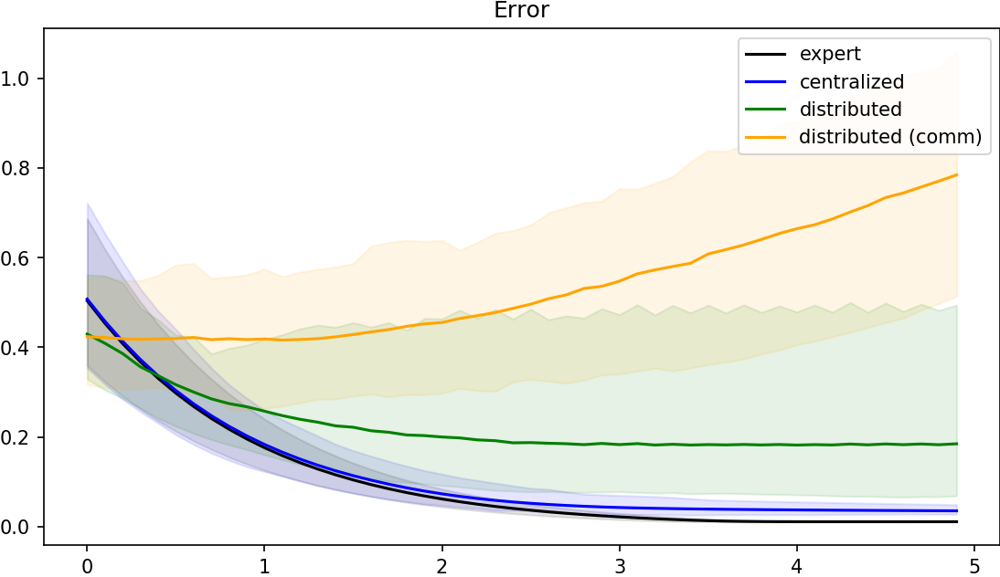

In [75]:
fig = plt.figure(figsize=(9, 5), dpi=150)
plot_error(time, exact_error, color='black', label='expert')
plot_error(time, net_error, color='blue', label='centralized')
plot_error(time, d_net_error, color='green', label='distributed')
plot_error(time, cd_net_error2, color='orange', label='distributed (comm)')
plt.legend()
plt.title('Error');